## CPU Hakkında

In [ ]:
!cat /proc/cpuinfo

processor	: 0
vendor_id	: AuthenticAMD
cpu family	: 23
model		: 49
model name	: AMD EPYC 7B12
stepping	: 0
microcode	: 0xffffffff
cpu MHz		: 2249.998
cache size	: 512 KB
physical id	: 0
siblings	: 2
core id		: 0
cpu cores	: 1
apicid		: 0
initial apicid	: 0
fpu		: yes
fpu_exception	: yes
cpuid level	: 13
wp		: yes
flags		: fpu vme de pse tsc msr pae mce cx8 apic sep mtrr pge mca cmov pat pse36 clflush mmx fxsr sse sse2 ht syscall nx mmxext fxsr_opt pdpe1gb rdtscp lm constant_tsc rep_good nopl nonstop_tsc cpuid extd_apicid tsc_known_freq pni pclmulqdq ssse3 fma cx16 sse4_1 sse4_2 x2apic movbe popcnt aes xsave avx f16c rdrand hypervisor lahf_lm cmp_legacy cr8_legacy abm sse4a misalignsse 3dnowprefetch osvw topoext ssbd ibrs ibpb stibp vmmcall fsgsbase tsc_adjust bmi1 avx2 smep bmi2 rdseed adx smap clflushopt clwb sha_ni xsaveopt xsavec xgetbv1 clzero xsaveerptr arat npt nrip_save umip rdpid
bugs		: sysret_ss_attrs null_seg spectre_v1 spectre_v2 spec_store_bypass retbleed smt_rsb srso
bogo

## RAM Hakkında

In [ ]:
!cat /proc/meminfo

MemTotal:       13290460 kB
MemFree:         8529016 kB
MemAvailable:   11914808 kB
Buffers:          158652 kB
Cached:          3377648 kB
SwapCached:            0 kB
Active:           906628 kB
Inactive:        3552284 kB
Active(anon):       2120 kB
Inactive(anon):   924296 kB
Active(file):     904508 kB
Inactive(file):  2627988 kB
Unevictable:          20 kB
Mlocked:              20 kB
SwapTotal:             0 kB
SwapFree:              0 kB
Dirty:               840 kB
Writeback:             0 kB
AnonPages:        922664 kB
Mapped:           435076 kB
Shmem:              3792 kB
KReclaimable:     178700 kB
Slab:             222668 kB
SReclaimable:     178700 kB
SUnreclaim:        43968 kB
KernelStack:        7344 kB
PageTables:        14912 kB
SecPageTables:         0 kB
NFS_Unstable:          0 kB
Bounce:                0 kB
WritebackTmp:          0 kB
CommitLimit:     6645228 kB
Committed_AS:    3489808 kB
VmallocTotal:   34359738367 kB
VmallocUsed:       13672 kB
VmallocChunk:    

# Veri Bilimi

<function matplotlib.pyplot.show(close=None, block=None)>

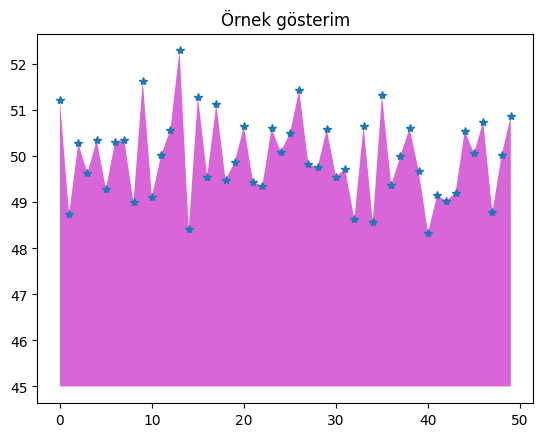

In [ ]:
import numpy as np
from matplotlib import pyplot as plt

ys= 50+np.random.randn(50)
x= [x for x in range(len(ys))]

plt.plot(x,ys, '*')
plt.fill_between(x, ys, 45,where=(ys>45), facecolor='m', alpha=0.6)
plt.fill_between(x, ys, 45,where=(ys<45), facecolor='r', alpha=0.5)
plt.title("Örnek gösterim")
plt.show

In [ ]:
from google.colab import drive
drive.mount('/gdrive')
%cd /gdrive

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).
/gdrive


In [ ]:
!ls "/gdrive/My Drive/Keras_Deep_Learning/"

[Errno 2] No such file or directory: 'My Drive/Keras_Deep_Learning/'
/gdrive


In [ ]:
import os
#os.chdir("/gdrive/My Drive/Keras_Deep_Learning/")

In [ ]:
!pip install -q keras
import keras

In [ ]:
!apt-get install graphviz -y

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
graphviz is already the newest version (2.42.2-6ubuntu0.1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.


## GPU Özelliklerinin Görüntülenmesi

In [ ]:
import tensorflow as tf
tf.test.gpu_device_name()

''

In [ ]:
import tensorflow_hub as hub


In [ ]:
print("Tensorflow version: ", tf.__version__)
print("Hub version: ", hub.__version__)
print("GPU is", "available" if tf.test.is_gpu_available() else "NOT AVAILABLE")

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


Tensorflow version:  2.17.1
Hub version:  0.16.1
GPU is NOT AVAILABLE


## Vektörler

In [ ]:
import numpy as np

In [ ]:
X= np.array(7)

In [ ]:
X.ndim

0

In [ ]:
X=np.array([12,3,6,14])
X.ndim

1

In [ ]:
X=np.array([[7,14,24],[7,14,24],[7,14,24]])
X.ndim

2

In [ ]:
from keras.datasets import mnist

In [ ]:
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
print(train_images.ndim)
print(train_images.shape)
print(train_images.dtype)

3
(60000, 28, 28)
uint8


In [ ]:
print(test_images.ndim)
print(test_images.shape)
print(test_images.dtype)

3
(10000, 28, 28)
uint8


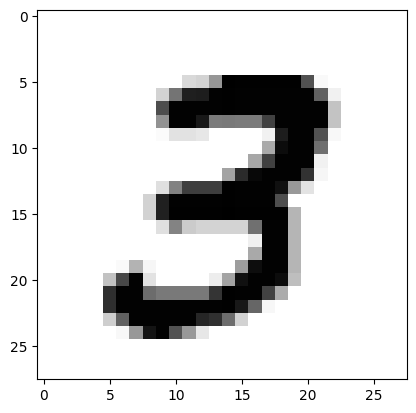

In [ ]:
import matplotlib.pyplot as plt
digit= train_images[7]
plt.imshow(digit, cmap=plt.cm.binary)
plt.show()

In [ ]:
dizinim=train_images[7:77]
print(dizinim.shape)

(70, 28, 28)


In [ ]:
dizinim=train_images[7:77,:,:]
print(dizinim.shape)

(70, 28, 28)


In [ ]:
dizinim=train_images[7:77,0:14,0:24]
print(dizinim.shape)

(70, 14, 24)


## İŞLEMLER

In [ ]:
def naive_add(x,y):
  assert len(x.shape)==2
  assert x.shape==y.shape

  x=x.copy()
  for i in range(x.shape[0]):
    for j in range(x.shape[1]):
      x[i,j]+=y[i,j]
  return x

In [ ]:
x=np.array([[7,14,24],[7,14,24],[7,14,24]])
y=np.array([[1,2,3],[5,6,7],[0,4,2]])
z=naive_add(x,y)
print(z)

q=x+y
print(q)

[[ 8 16 27]
 [12 20 31]
 [ 7 18 26]]
[[ 8 16 27]
 [12 20 31]
 [ 7 18 26]]


In [ ]:
def naive_relu(x):
  assert len(x.shape)==2

  x=x.copy()
  for i in range(x.shape[0]):
    for j in range(x.shape[1]):
      x[i,j]=max(x[i,j],0)
  return x
z=naive_relu(x)
print(z)

q=np.maximum(z,0)
print(q)

[[ 7 14 24]
 [ 7 14 24]
 [ 7 14 24]]
[[ 7 14 24]
 [ 7 14 24]
 [ 7 14 24]]


In [ ]:
def naive_add_matrix_and_vector(x,y):
  assert len(x.shape)==2
  assert len(y.shape)==1
  assert x.shape[1]==y.shape[0]
  x=x.copy()
  for i in range(x.shape[0]):
    for j in range(x.shape[1]):
      x[i,j]+=y[j]
  return x

x=np.array([[7,14,24],[7,14,24],[7,14,24]])
y=np.array([1,2,3])
z=naive_add_matrix_and_vector(x,y)
print(z)


[[ 8 16 27]
 [ 8 16 27]
 [ 8 16 27]]


In [ ]:
x=np.array([[1,2],[1,2]])
y=np.array([[1,2],[1,2]])
z=x.dot(y)
print(z)

[[3 6]
 [3 6]]


In [ ]:
x=np.array([[0.,1.],[2.,3.],[4.,5.]])
print(x.shape)

(3, 2)


In [ ]:
x=x.reshape((6,1))
print(x)

[[0.]
 [1.]
 [2.]
 [3.]
 [4.]
 [5.]]


In [ ]:
x=np.zeros((100,10))
print(x.shape)

(100, 10)


In [ ]:
x=np.transpose(x)
print(x.shape)

(10, 100)


## MNIST VERİ SETİNİ KULLANARAK YAPAY SİNİR AĞI GELİŞTİRME

In [ ]:
from keras.datasets import mnist
(train_images, train_labels), (test_images, test_labels) = mnist.load_data()

In [ ]:
from keras import models
from keras import layers

network = models.Sequential()
network.add(layers.Dense(512, activation='relu', input_shape=(28 * 28,)))
network.add(layers.Dense(10, activation='softmax'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
network.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
train_images = train_images.reshape((60000, 28 * 28))
train_images = train_images.astype('float32') / 255 #normalization
test_images = test_images.reshape((10000, 28 * 28))
test_images = test_images.astype('float32') / 255

In [ ]:
from keras.utils import to_categorical

train_labels = to_categorical(train_labels)
test_labels = to_categorical(test_labels)

In [ ]:
network.fit(train_images, train_labels, epochs=5, batch_size=128)

Epoch 1/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.1659 - loss: 2.2813
Epoch 2/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - accuracy: 0.5353 - loss: 1.8882
Epoch 3/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 9ms/step - accuracy: 0.7174 - loss: 1.1673
Epoch 4/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 8ms/step - accuracy: 0.8014 - loss: 0.8063
Epoch 5/5
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step - accuracy: 0.8349 - loss: 0.6382


In [ ]:
test_loss, test_acc = network.evaluate(test_images, test_labels)
print('test_acc:', test_acc)
print('test_loss:', test_loss)

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - accuracy: 0.7322 - loss: 47.8150
test_acc: 0.7444999814033508
test_loss: 46.11960220336914


## AKTİVASYON FONKSİYORNLARI

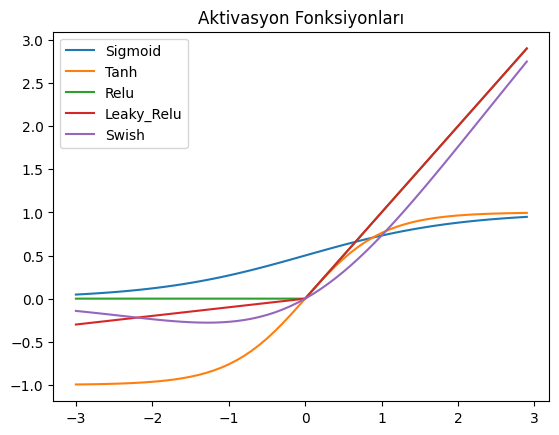

In [ ]:
import math
import numpy as np
import matplotlib.pyplot as plt


#SIGMOID
def sigmoid(x):
  a=[]
  for i in x:
    a.append(1/(1+math.exp(-i)))
  return a

#HIPERBOLIK TANJANT
def tanh(x,derivative=False):
  if derivative==True:
    return (1-(x**2))
  return np.tanh(x)

#RELU
def re(x):
  b=[]
  for i in x:
    if i>0:
      b.append(i)
    else:
      b.append(0)
  return b

#LEAKY RELU
def lr(x):
  b=[]
  for i in x:
    if i<0:
      b.append(i/10)
    else:
      b.append(i)
  return b

#SWISH
#swish=sig*x

#Grafiklerin oluşturulması için aralıkların tanımlanması
x=np.arange(-3.,3.,0.1)

sig=sigmoid(x)
tanh=tanh(x)
relu=re(x)
leaky_relu=lr(x)
swish=sig*x

#Grafiklerin ekrana çizdirilmesi
line_1=plt.plot(x,sig,label="Sigmoid")
line_2=plt.plot(x,tanh,label="Tanh")
line_3=plt.plot(x,relu,label="Relu")
line_4=plt.plot(x,leaky_relu,label="Leaky_Relu")
line_5=plt.plot(x,swish,label="Swish")
plt.legend()
plt.title("Aktivasyon Fonksiyonları")
plt.show()


## EVRIŞIMLI SINIR AĞI

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import h5py

plt.rcParams['figure.figsize'] = (5.0,4.0)
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

np.random.seed(1)

In [ ]:
def zero_pad(X, pad):
  X_pad=np.pad(X,((0,0),(pad,pad),(pad,pad),(0,0)),'constant',constant_values=(0,0))
  return X_pad

In [ ]:
np.random.seed(1)
x=np.random.randn(4,3,3,2)
x_pad=zero_pad(x,2)

print(x.shape)
print(x_pad.shape)
print(x[1,1])
print(x_pad[1,1])

(4, 3, 3, 2)
(4, 7, 7, 2)
[[ 0.90085595 -0.68372786]
 [-0.12289023 -0.93576943]
 [-0.26788808  0.53035547]]
[[0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]
 [0. 0.]]


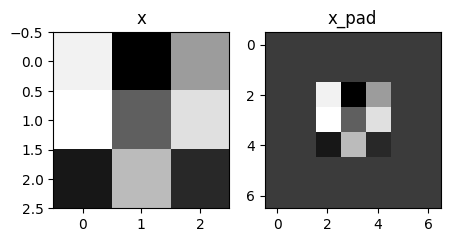

In [ ]:
fig,axarr=plt.subplots(1,2)
axarr[0].set_title('x')
axarr[0].imshow(x[0,:,:,0])
axarr[1].set_title('x_pad')
axarr[1].imshow(x_pad[0,:,:,0])

In [ ]:
def conv_single_step(a_slice_prev, W, b):
  s=np.multiply(a_slice_prev,W)
  Z=np.sum(s)
  Z=Z+float(b)
  return Z

In [ ]:
np.random.seed(1)
a_slice_prev=np.random.randn(4,4,3)
W=np.random.randn(4,4,3)
b=np.random.randn(1,1,1)

Z=conv_single_step(a_slice_prev,W,b)
print(Z)

-6.999089450680221


<ipython-input-9-7a554544e76a>:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  Z=Z+float(b)


In [ ]:
def conv_forward(A_prev, W, b, hparameters):
  (m, n_H_prev, n_W_prev, n_C_prev) = A_prev.shape
  (f, f, n_C_prev, n_C) = W.shape
  stride = hparameters["stride"]
  pad = hparameters["pad"]
  n_H=int(((n_H_prev-f+2*pad)/stride)+1)
  n_W=int(((n_W_prev-f+2*pad)/stride)+1)
  Z=np.zeros((m,n_H,n_W,n_C))
  A_prev_pad=zero_pad(A_prev,pad)
  for i in range(m):
    a_prev_pad=A_prev_pad[i]
    for h in range(n_H):
      for w in range(n_W):
        for c in range(n_C):
          vert_start=h*stride
          vert_end=vert_start+f
          horiz_start=w*stride
          horiz_end=horiz_start+f
          a_slice_prev=a_prev_pad[vert_start:vert_end,horiz_start:horiz_end,:]
          Z[i,h,w,c]=conv_single_step(a_slice_prev,W[...,c],b[...,c])

  assert(Z.shape==(m,n_H,n_W,n_C))
  cache=(A_prev,W,b,hparameters)
  return Z,cache

In [ ]:
np.random.seed(1)
A_prev =np.random.randn(10,4,4,3)
W = np.random.randn(2,2,3,8)
b = np.random.randn(1,1,1,8)

hparameters = {"pad" : 2,
               "stride": 2}

Z, cache_conv = conv_forward(A_prev, W, b, hparameters)
print("z ort: ", np.mean(Z))
print("Z[3,2,1] = ",Z[3,2,1])
print("cache_conv[0][1][2][3]: ", cache_conv[0][1][2][3])


z ort:  0.048995203528855794
Z[3,2,1] =  [-0.61490741 -6.7439236  -2.55153897  1.75698377  3.56208902  0.53036437
  5.18531798  8.75898442]
cache_conv[0][1][2][3]:  [-0.20075807  0.18656139  0.41005165]


<ipython-input-9-7a554544e76a>:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  Z=Z+float(b)


In [ ]:
from functools import cache
def pool_forward(A_prev, hparameters, mode = "max"):
  (m, n_H_prev, n_W_prev, n_C_prev) = A_prev.shape
  f=hparameters["f"]
  stride=hparameters["stride"]
  n_H =int(((n_H_prev-f)/stride)+1)
  n_W = int(((n_W_prev-f)/stride)+1)
  n_C = n_C_prev
  A=np.zeros((m,n_H,n_W,n_C))
  for i in range(m):
    for h in range(n_H):
      for w in range(n_W):
        for c in range(n_C):
          vert_start=h*stride
          vert_end=vert_start+f
          horiz_start=w*stride
          horiz_end=horiz_start+f
          a_prev_slice=A_prev[i,vert_start:vert_end,horiz_start:horiz_end,c]
          if mode=="max":
            A[i,h,w,c]=np.max(a_prev_slice)
          elif mode=="average":
            A[i,h,w,c]=np.mean(a_prev_slice)
  cache=(A_prev,hparameters)
  assert(A.shape==(m,n_H,n_W,n_C))
  return A,cache

In [ ]:
np.random.seed(1)
A_prev = np.random.randn(2, 4, 4, 3)
hparameters = {"stride" : 2, "f": 3}

A, cache = pool_forward(A_prev, hparameters)
print("mode = max")
print("A =", A)
print()
A, cache = pool_forward(A_prev, hparameters, mode = "average")
print("mode = average")
print("A =", A)

mode = max
A = [[[[1.74481176 0.86540763 1.13376944]]]


 [[[1.13162939 1.51981682 2.18557541]]]]

mode = average
A = [[[[ 0.02105773 -0.20328806 -0.40389855]]]


 [[[-0.22154621  0.51716526  0.48155844]]]]


In [ ]:
def conv_backward(dZ, cache):
  (A_prev, W, b, hparameters) = cache
  (m, n_H_prev, n_W_prev, n_C_prev) = A_prev.shape
  (f, f, n_C_prev, n_C) = W.shape

  stride=hparameters["stride"]
  pad=hparameters["pad"]

  (m, n_H, n_W, n_C) = dZ.shape
  dA_prev=np.zeros((m,n_H_prev,n_W_prev,n_C_prev))
  dW=np.zeros((f,f,n_C_prev,n_C))
  db=np.zeros((1,1,1,n_C))

  A_prev_pad=zero_pad(A_prev,pad)
  dA_prev_pad=zero_pad(dA_prev,pad)

  for i in range(m):
    a_prev_pad=A_prev_pad[i]
    da_prev_pad=dA_prev_pad[i]
    for h in range(n_H):
      for w in range(n_W):
        for c in range(n_C):
          vert_start=h
          vert_end=vert_start+f
          horiz_start=w
          horiz_end=horiz_start+f
          a_slice=a_prev_pad[vert_start:vert_end,horiz_start:horiz_end,:]
          da_prev_pad[vert_start:vert_end,horiz_start:horiz_end,:]+=W[:,:,:,c]*dZ[i,h,w,c]
          dW[:,:,:,c]+=a_slice*dZ[i,h,w,c]
          db[:,:,:,c]+=dZ[i,h,w,c]
    dA_prev[i,:,:,:]=da_prev_pad[pad:-pad,pad:-pad,:]
  assert(dA_prev.shape==(m,n_H_prev,n_W_prev,n_C_prev))
  return dA_prev,dW,db

In [ ]:
np.random.seed(1)
A_prev =np.random.randn(10,4,4,3)
W = np.random.randn(2,2,3,8)
b = np.random.randn(1,1,1,8)

hparameters = {"pad" : 2,
               "stride": 2}

Z, cache_conv = conv_forward(A_prev, W, b, hparameters) # This line defines Z and cache_conv

np.random.seed(1)
dA, dW, db = conv_backward(Z, cache_conv) # Now Z and cache_conv are available here
print("dA_mean =", np.mean(dA))
print("dW_mean =", np.mean(dW))
print("db_mean =", np.mean(db))

dA_mean = 0.6347704472654743
dW_mean = 1.5572657428497354
db_mean = 7.839232564616838


<ipython-input-9-7a554544e76a>:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  Z=Z+float(b)


In [ ]:
def create_mask_from_window(x):
  mask=x==np.max(x)
  return mask


In [ ]:
np.random.seed(1)
x = np.random.randn(2,3)
mask = create_mask_from_window(x)
print('x = ', x)
print("mask = ", mask)

x =  [[ 1.62434536 -0.61175641 -0.52817175]
 [-1.07296862  0.86540763 -2.3015387 ]]
mask =  [[ True False False]
 [False False False]]


In [ ]:
def distribute_value(dz, shape):
  (n_H,n_W)=shape
  average=dz/(n_H*n_W)
  a=np.ones(shape)*average
  return a


In [ ]:
a=distribute_value(2,(2,2))
print(a)

[[0.5 0.5]
 [0.5 0.5]]


In [ ]:
def pool_backward(dA, cache, mode = "max"):
  (A_prev, hparameters) = cache
  stride=hparameters["stride"]
  f=hparameters["f"]
  m,n_H_prev,n_W_prev,n_C_prev=A_prev.shape
  m,n_H,n_W,n_C=dA.shape
  dA_prev=np.zeros(A_prev.shape)
  for i in range(m):
    a_prev=A_prev[i]
    for h in range(n_H):
      for w in range(n_W):
        for c in range(n_C):
          vert_start=h
          vert_end=vert_start+f
          horiz_start=w
          horiz_end=horiz_start+f

          if mode=="max":
            a_prev_slice = a_prev[vert_start:vert_end, horiz_start:horiz_end, c]
            mask = create_mask_from_window(a_prev_slice)
            dA_prev[i, vert_start:vert_end, horiz_start:horiz_end, c] += np.multiply(mask, dA[i, h, w, c])
          elif mode=="average":
            da=dA[i,h,w,c]
            shape=(f,f)
            dA_prev[i,vert_start:vert_end,horiz_start:horiz_end,c]+=distribute_value(da,shape)
  assert(dA_prev.shape==A_prev.shape)
  return dA_prev


In [ ]:
np.random.seed(1)
A_prev = np.random.randn(5, 5, 3, 2)
hparameters = {"stride" : 1, "f": 2}
A, cache = pool_forward(A_prev, hparameters)
dA=np.random.randn(5, 4, 2, 2)

dA_prev = pool_backward(dA, cache, mode = "max")
print("mode = max")
print('mean of dA = \n', np.mean(dA))
print('dA_prev[1,1] = \n', dA_prev[1,1])

print()
dA_prev = pool_backward(dA, cache, mode = "average")
print("mode = average")
print('mean of dA = \n', np.mean(dA))
print('dA_prev[1,1] = \n', dA_prev[1,1])

mode = max
mean of dA = 
 0.14571390272918056
dA_prev[1,1] = 
 [[ 0.          0.        ]
 [ 5.05844394 -1.68282702]
 [ 0.          0.        ]]

mode = average
mean of dA = 
 0.14571390272918056
dA_prev[1,1] = 
 [[ 0.08485462  0.2787552 ]
 [ 1.26461098 -0.25749373]
 [ 1.17975636 -0.53624893]]


### MNIST Rakam tanıma

In [ ]:
from __future__ import print_function
import keras
from keras.datasets import mnist
from keras.models import load_model
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras. layers import Conv2D, MaxPooling2D
from keras import backend as K

import matplotlib.pyplot as plt

In [ ]:
(x_train, y_train), (x_test, y_test) = mnist.load_data()

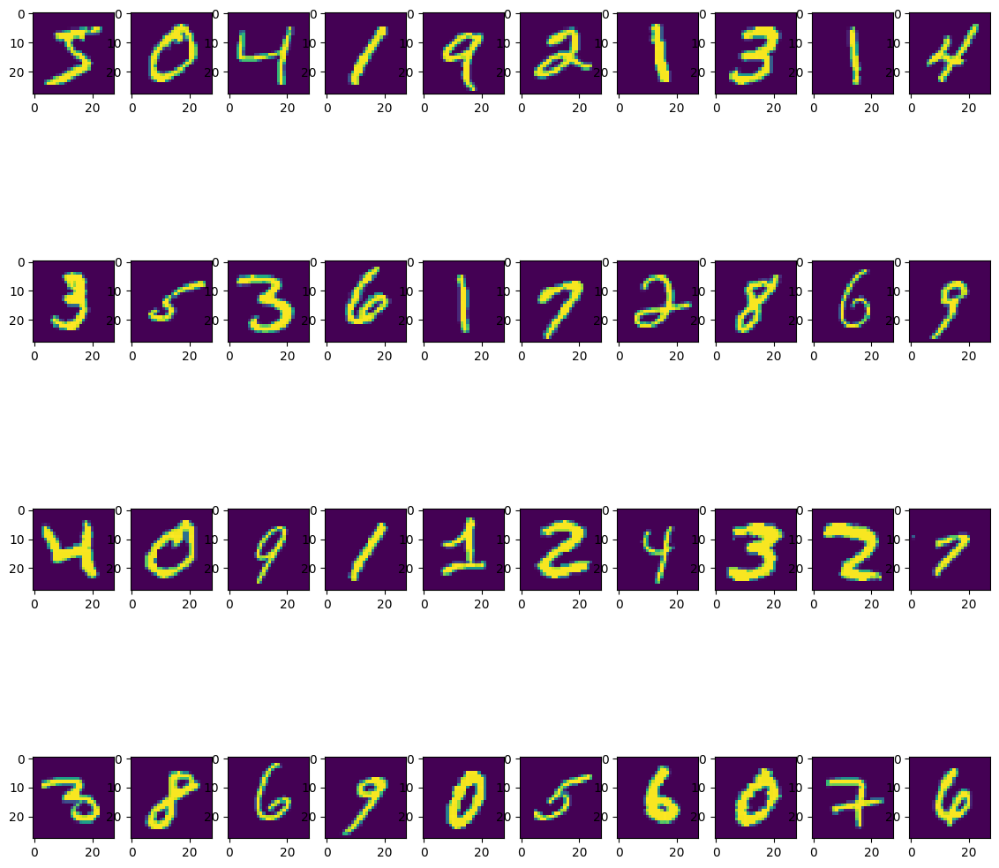

In [ ]:

plt.figure(figsize=(14,14))
x, y = 10, 4
for i in range(40):
    plt.subplot(y, x, i+1)
    plt.imshow(x_train[i])
plt.show()

In [ ]:
batch_size = 128
num_classes = 10
epochs = 5
img_rows, img_cols = 28, 28
input_shape = (img_rows, img_cols, 1)

if K.image_data_format() == 'channels_first':
    x_train = x_train.reshape(x_train.shape[0], 1, img_rows, img_cols,1)
    x_test = x_test.reshape(x_test.shape[0], 1, img_rows, img_cols,1)
    input_shape = (1, img_rows, img_cols,1)


In [ ]:
y_train = keras.utils.to_categorical(y_train, num_classes)
y_test = keras.utils.to_categorical(y_test, num_classes)


In [ ]:
model =Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),activation='relu',input_shape=input_shape))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())#tam bağlantı katmanı
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 26, 26, 32)          │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 24, 24, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 12, 12, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 12, 12, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 9216)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       1,179,776 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           1,290 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,199,882 (4.58 MB)

 Trainable params: 1,199,882 (4.58 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:

model.compile(loss = keras.losses.categorical_crossentropy,
             optimizer = keras.optimizers.Adadelta(),
             metrics = ['accuracy'])


In [ ]:
model.fit(x_train, y_train,
          batch_size=batch_size,
          epochs=epochs,
          verbose=1,
          validation_data=(x_test, y_test))


In [ ]:
model.save('save_models/mnist.h5')
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])


In [ ]:
test_image = x_test[32]
y_test[32]

In [ ]:
plt.imshow(test_image.reshape(28,28))

In [ ]:
test_data = x_test[32].reshape(1,28,28,1)
pre=model_test.predict(test_data, batch_size=1)


### FASHION_MNIST_CNN

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')


Mounted at /content/drive/


In [ ]:
!ls drive

MyDrive


In [ ]:
!pip3 install -q keras


In [ ]:
from __future__ import print_function
import keras
from keras.datasets import fashion_mnist
from keras.models import load_model
import os
import numpy as np

import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline

import random

In [ ]:
(x_train, y_train), (x_test, y_test) = fashion_mnist.load_data()

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
print("x_train shape:", x_train.shape, "\ny_train shape:", y_train.shape)
print("x_test shape:", x_test.shape, "\ny_test shape:", y_test.shape)

x_train shape: (60000, 28, 28) 
y_train shape: (60000,)
x_test shape: (10000, 28, 28) 
y_test shape: (10000,)


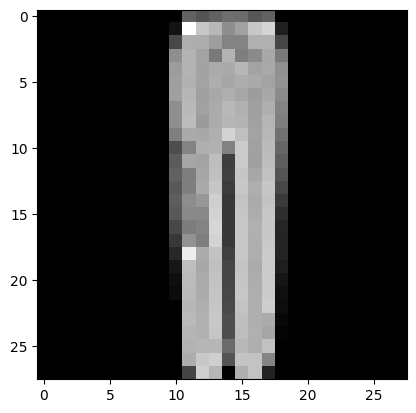

In [ ]:
plt.imshow(x_train[1000],cmap="gray")

In [ ]:
fashion_mnist_labels = np.array([
    'Tişört/Üst',
    'Pantolon',
    'Kazak',
    'Elbise',
    'Ceket',
    'Sandalet',
    'Gömlek',
    'Sneaker',
    'Çanta',
    'Bilekte Bot'])


In [ ]:
root = 'drive/MyDrive/'
model = load_model(root + 'model_fashion-mnist_cnn_train2_epoch24.h5')

def convertMnistData(image):
    img = image.astype('float32')
    img /= 255

    return image.reshape(1,28,28,1)

plt.figure(figsize=(16,16))

right = 0
mistake = 0
prefictionNum = 200

for i in range(prefictionNum):
    index = random.randint(0, x_test.shape[0])
    image = x_test[index]
    data = convertMnistData(image)

    plt.subplot(10, 10, i+1)
    plt.imshow(image,  cmap=cm.gray_r)
    plt.axis('off')
    ret = model.predict(data, batch_size=1)
    #yazdır(ret)

    bestnum = 0.0
    bestclass = 0
    for n in [0,1,2,3,4,5,6,7,8,9]:
        if bestnum < ret[0][n]:
            bestnum = ret[0][n]
            bestclass = n

    if y_test[index] == bestclass:
        plt.title(fashion_mnist_labels[bestclass])
        right += 1
    else:
        #tahmin edilen sınıf != gerçek sınıf
        plt.title(fashion_mnist_labels[bestclass] + "!=" + fashion_mnist_labels[y_test[index]], color='#ff0000')
        mistake += 1

plt.show()
print("Doğru tahminlerin sayısı:", right)
print("Hata sayısı:", mistake)
print("Doğru tahmin oranı:", right/(mistake + right)*100, '%')

### VGG16 NESNE TANIMA

In [ ]:
import numpy as np
from PIL import Image
from keras.applications.vgg16 import VGG16, preprocess_input, decode_predictions

In [ ]:
model = VGG16(weights='imagenet', include_top=True)

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 4s 0us/step


In [ ]:
layers=dict([(layer.name, layer.output) for layer in model.layers])
layers

{'input_layer': <KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=False, name=keras_tensor>,
 'block1_conv1': <KerasTensor shape=(None, 224, 224, 64), dtype=float32, sparse=False, name=keras_tensor_1>,
 'block1_conv2': <KerasTensor shape=(None, 224, 224, 64), dtype=float32, sparse=False, name=keras_tensor_2>,
 'block1_pool': <KerasTensor shape=(None, 112, 112, 64), dtype=float32, sparse=False, name=keras_tensor_3>,
 'block2_conv1': <KerasTensor shape=(None, 112, 112, 128), dtype=float32, sparse=False, name=keras_tensor_4>,
 'block2_conv2': <KerasTensor shape=(None, 112, 112, 128), dtype=float32, sparse=False, name=keras_tensor_5>,
 'block2_pool': <KerasTensor shape=(None, 56, 56, 128), dtype=float32, sparse=False, name=keras_tensor_6>,
 'block3_conv1': <KerasTensor shape=(None, 56, 56, 256), dtype=float32, sparse=False, name=keras_tensor_7>,
 'block3_conv2': <KerasTensor shape=(None, 56, 56, 256), dtype=float32, sparse=False, name=keras_tensor_8>,
 'block3_conv3': <KerasTen

In [ ]:
model.count_params()

138357544

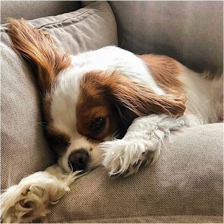

In [ ]:
image=Image.open('betty.jpg')
image=image.resize((224,224))
image

In [ ]:
x=np.array(image, dtype='float32')
x=np.expand_dims(x, axis=0)
x=preprocess_input(x)


In [ ]:
preds=model.predict(x)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


In [ ]:
print("predicted: ",decode_predictions(preds, top=3)[0])
print(decode_predictions(preds, top=3)[0][0][1])

predicted:  [('n02086646', 'Blenheim_spaniel', 0.9933588), ('n02085782', 'Japanese_spaniel', 0.005671383), ('n02086910', 'papillon', 0.0002688676)]
Blenheim_spaniel


### IMAGENET-RESNET-NESNE TANIMA


In [ ]:
from keras.applications import ResNet50
from keras.preprocessing.image import img_to_array
from keras.applications import imagenet_utils
from PIL import Image
import numpy as np
from io import BytesIO
import os
import requests

In [ ]:
model = ResNet50(weights="imagenet")

102967424/102967424 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
def prepare_image(image, target):
	# giriş görüntüsünü yeniden boyutlandırma ve ön işlemerin yapılması
	image = image.resize(target)
	image = img_to_array(image)
	image = np.expand_dims(image, axis=0)
	image = imagenet_utils.preprocess_input(image)

	# işlenmiş görüntüyü alma
	return image

In [ ]:
#@title Default title text { vertical-output: true }
ImageURL = "https://imgix.bustle.com/uploads/image/2018/4/9/471897e4-4a04-4373-9112-53c381928d89-shutterstock_1064524748.jpg?w=970&h=582&fit=crop&crop=faces&auto=format&q=70" #@param {type:"string"}


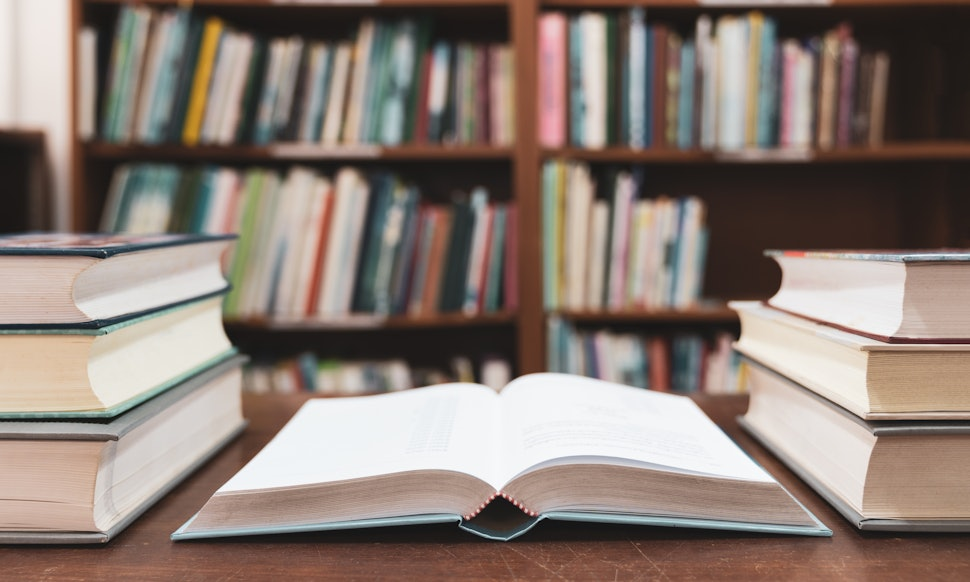

In [ ]:
#ImageURL = "https://imgix.bustle.com/uploads/image/2018/4/9/471897e4-4a04-4373-9112-53c381928d89-shutterstock_1064524748.jpg?w=970&h=582&fit=crop&crop=faces&auto=format&q=70
response = requests.get(ImageURL)
image = Image.open(BytesIO(response.content))
image

In [ ]:
data = {"success": False}

pre_image = prepare_image(image, target=(224, 224)) # 224 x 224 boyutlu hale getir

preds = model.predict(pre_image) # Kesirim modeline ön işlemden geçmiş görüntüyü uygula

results = imagenet_utils.decode_predictions(preds) #kestirim
data["predictions"] = []


for (imagenetID, label, prob) in results[0]: # ImageNet veri kümseinden etiket, olasılık ve kestrim sonucunu al
  r = {"label": label, "probability": float(prob)}
  data["predictions"].append(r)

data["success"] = True

print(data)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
{'success': True, 'predictions': [{'label': 'library', 'probability': 0.824184000492096}, {'label': 'bookshop', 'probability': 0.13390034437179565}, {'label': 'bookcase', 'probability': 0.039223700761795044}, {'label': 'binder', 'probability': 0.0007627388695254922}, {'label': 'book_jacket', 'probability': 0.0002641173778101802}]}


In [ ]:
print("Sınıflandırma tahmini en yüksek olan {0} oranıyla {1}'dır.".format(data["predictions"][0]["probability"],data["predictions"][0]["label"]))
# En yüksek olasılıklı sonucu ekrana yazdır


Sınıflandırma tahmini en yüksek olan 0.824184000492096 oranıyla library'dır.


### DUYGU TANIMA UYGULAMASI

In [ ]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
%matplotlib inline
from keras.layers import Dense, Conv2D, Activation, MaxPool2D, Flatten, Dropout, BatchNormalization
import keras
from keras.models import Sequential, Model
model =Sequential()

In [ ]:
#1.katman
model.add(Conv2D(64,3,data_format='channels_last',kernel_initializer='he_normal' , input_shape=(48,48,1)))
model.add(BatchNormalization())
model.add(Activation('relu'))

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
#2.katman
model.add(Conv2D(64,3))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPool2D(pool_size=(2,2),strides=2))
model.add(Dropout(0.6))

In [ ]:
#3.katman
model.add(Conv2D(32,3))
model.add(BatchNormalization())
model.add(Activation('relu'))

In [ ]:
#4.katman
model.add(Conv2D(32,3))
model.add(BatchNormalization())
model.add(Activation('relu'))

In [ ]:
#5.katman
model.add(Conv2D(32,3))
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(MaxPool2D(pool_size=(2,2),strides=2))
model.add(Dropout(0.6))

In [ ]:
#Tam bağlantı katmanı
model.add(Flatten())
model.add(Dense(128))#2048lik vetörü 128e indirdik
model.add(BatchNormalization())
model.add(Activation('relu'))
model.add(Dropout(0.6))

In [ ]:
#Çıkış katmanı
model.add(Dense(7))
model.add(Activation('softmax'))#sınıflandırma işlemi (7 duygu sınıfı var)

model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)                    │ (None, 46, 46, 64)          │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 46, 46, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation (Activation)              │ (None, 46, 46, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 44, 44, 64)          │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 44, 44, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_1 (Activation)            │ (None, 44, 44, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 22, 22, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 22, 22, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 20, 20, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 20, 20, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_2 (Activation)            │ (None, 20, 20, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 18, 18, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 18, 18, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_3 (Activation)            │ (None, 18, 18, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 16, 16, 32)          │           9,248 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 16, 16, 32)          │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ activation_4 (Activation)            │ (None, 16, 16, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 8, 8, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 8, 8, 32)            │              

 Total params: 339,111 (1.29 MB)

 Trainable params: 338,407 (1.29 MB)

 Non-trainable params: 704 (2.75 KB)

## RECURRENT NEURAL NETWORK(RNN)

In [ ]:
import numpy as np

In [ ]:
timesteps=100
input_features=32
output_features=64

In [ ]:
inputs = np.random.random((timesteps, input_features))

In [ ]:
state_t=np.zeros((output_features,))

In [ ]:
W=np.random.random((output_features, input_features))
U=np.random.random((output_features, output_features))
b=np.random.random((output_features,))

In [ ]:
successive_outputs = []
for input_t in inputs:
  output_t = np.tanh(np.dot(W, input_t) + np.dot(U, state_t) +b)
  successive_outputs.append(output_t)
  state_t = output_features

final_output_sequence = np.concatenate(successive_outputs)

In [ ]:
output_t = np.tanh(np.dot(W, input_t) + np.dot(U, state_t) + b)

In [ ]:
output_t

array([[1.        , 1.        , 1.        , ..., 1.        , 0.99999999,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       ...,
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ],
       [1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        1.        ]])

### IMDB

In [ ]:
from keras.layers import SimpleRNN, Embedding, Dense
from keras.models import Sequential
from keras.datasets import imdb
from keras.preprocessing import sequence

In [ ]:
num_features=10000
maxlen=500
batch_size=32

In [ ]:
print("load data")
(input_train, y_train), (input_test, y_test) = imdb.load_data(num_words=num_features)
print(len(input_train), 'train sequences')
print(len(input_test), 'test sequences')

load data
17464789/17464789 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
25000 train sequences
25000 test sequences


In [ ]:
print("pad sequences (samples x time)")
input_train = sequence.pad_sequences(input_train, maxlen=maxlen)
input_test = sequence.pad_sequences(input_test, maxlen=maxlen)

pad sequences (samples x time)


Basit RNN ile modelleme

In [ ]:
#Embedding ve SimpleRNN katmanının eğitilmesi
model=Sequential()
model.add(Embedding(num_features, 32))
model.add(SimpleRNN(32))
model.add(Dense(1, activation='sigmoid'))

Basit LSTM ile modelleme

In [ ]:
from keras import layers
model = Sequential()
model.add(layers.Embedding(num_features, 32))
model.add(layers.Bidirectional(layers.LSTM(32)))
model.add(Dense(1, activation='sigmoid'))
model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ embedding_3 (Embedding)              │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ ?                           │     0 (unbuilt) │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ ?                           │     0 (unbuilt) │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

Modelin Derlenmesi RNN

In [ ]:
model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['acc'])

history=model.fit(input_train, y_train, epochs=10, batch_size=128, validation_split=0.2)

Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 21s 109ms/step - acc: 0.5642 - loss: 0.6731 - val_acc: 0.5730 - val_loss: 0.7765
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step - acc: 0.7785 - loss: 0.4829 - val_acc: 0.7136 - val_loss: 0.5730
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 13s 78ms/step - acc: 0.8562 - loss: 0.3477 - val_acc: 0.8666 - val_loss: 0.3438
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 11s 71ms/step - acc: 0.8929 - loss: 0.2725 - val_acc: 0.8146 - val_loss: 0.4188
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 20s 71ms/step - acc: 0.9271 - loss: 0.2037 - val_acc: 0.8458 - val_loss: 0.3941
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 20s 69ms/step - acc: 0.9432 - loss: 0.1527 - val_acc: 0.8518 - val_loss: 0.4473
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 11s 68ms/step - acc: 0.9623 - loss: 0.1142 - val_acc: 0.7960 - val_loss: 0.5385
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 15s 93ms/step - acc: 0.9754 - loss: 0.0769 - val_acc: 0.8300 - val_loss: 0.5027
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━

Modelin Derlenmesi LSTM

In [ ]:
model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['acc'])

history=model.fit(input_train, y_train, epochs=10, batch_size=128, validation_split=0.2)

Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 12s 37ms/step - acc: 0.5491 - loss: 0.6769 - val_acc: 0.7106 - val_loss: 0.5608
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - acc: 0.8003 - loss: 0.4512 - val_acc: 0.8498 - val_loss: 0.3653
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 37ms/step - acc: 0.8610 - loss: 0.3439 - val_acc: 0.8142 - val_loss: 0.4273
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - acc: 0.8726 - loss: 0.3216 - val_acc: 0.8164 - val_loss: 0.4681
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - acc: 0.8869 - loss: 0.2841 - val_acc: 0.8712 - val_loss: 0.3074
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - acc: 0.8989 - loss: 0.2593 - val_acc: 0.8658 - val_loss: 0.3392
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - acc: 0.9075 - loss: 0.2386 - val_acc: 0.8784 - val_loss: 0.3462
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - acc: 0.9149 - loss: 0.2224 - val_acc: 0.8862 - val_loss: 0.2883
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 10s 3

In [ ]:
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

In [ ]:
epochs = range(1, len(acc) + 1)

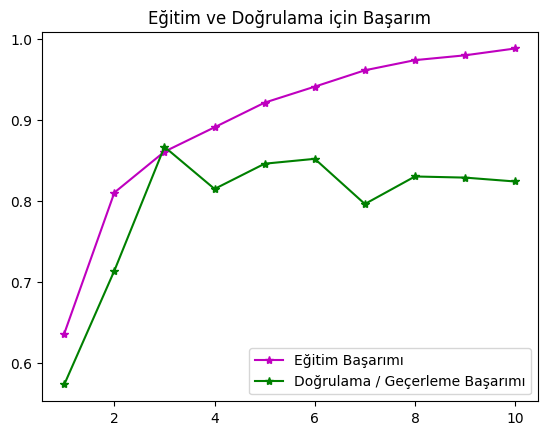

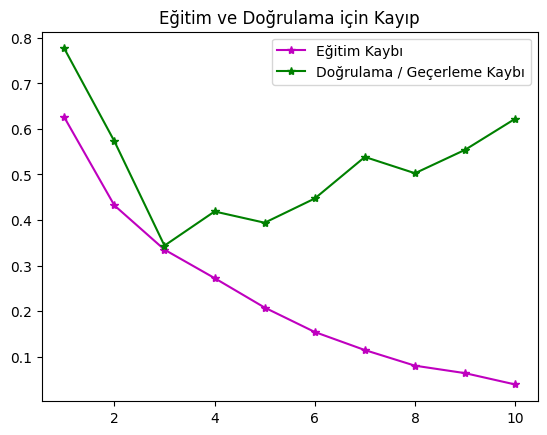

In [ ]:
plt.plot(epochs, acc, 'm*-', label= 'Eğitim Başarımı')
plt.plot(epochs, val_acc, 'g*-', label= 'Doğrulama / Geçerleme Başarımı')
plt.title('Eğitim ve Doğrulama için Başarım')
plt. legend()

plt.figure()

plt.plot(epochs, loss, 'm*-', label= 'Eğitim Kaybı')
plt.plot(epochs, val_loss, 'g*-', label= 'Doğrulama / Geçerleme Kaybı')
plt.title('Eğitim ve Doğrulama için Kayıp')
plt. legend()

plt.show()

In [ ]:
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

In [ ]:
epochs = range(1, len(acc) + 1)

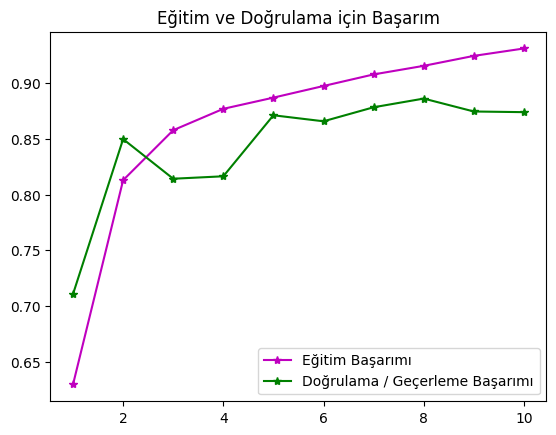

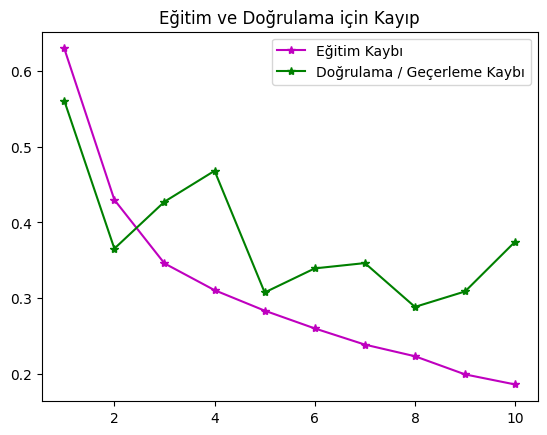

In [ ]:
plt.plot(epochs, acc, 'm*-', label= 'Eğitim Başarımı')
plt.plot(epochs, val_acc, 'g*-', label= 'Doğrulama / Geçerleme Başarımı')
plt.title('Eğitim ve Doğrulama için Başarım')
plt. legend()

plt.figure()

plt.plot(epochs, loss, 'm*-', label= 'Eğitim Kaybı')
plt.plot(epochs, val_loss, 'g*-', label= 'Doğrulama / Geçerleme Kaybı')
plt.title('Eğitim ve Doğrulama için Kayıp')
plt. legend()

plt.show()

## DEEP DREAM URETME

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import inception_v3

base_image_path = keras.utils.get_file("yeni.jpg", "https://images.unsplash.com/photo-1474418397713-7ede21d49118?ixlib=rb-1.2.1&ixid=eyJhcHBfaWQiOjEyMDd9&auto=format&fit=crop&w=736&q=80")
result_prefix = "yeni_dream"

#Bunlar, aktivasyonu en üst düzeye çıkarmaya çalıştığımız katmanların adları
#ve en üst düzeye çıkarmaya çalıştığımız son kayıptaki ağırlıklarıdır.

#Yeni görsel efektler elde etmek için bu ayarı düzenleyebilirsiniz.
layer_settings = {
    "mixed4": 2.0,
    "mixed5": 3.5,
    "mixed6": 2.0,
    "mixed7": 3.5,
}

# Bu hiperparametrelerle oynamak da yeni efektler elde etmenizi sağlar
step = 0.01  # Gradyan çıkış adımı boyutu
num_octave = 3  # Gradyan yükselmesinin çalıştırılacağı ölçek sayısı
octave_scale = 1.4  # Ölçekler arasındaki boyut oranı
iterations = 20  # Ölçek başına çıkış adımı sayısı
max_loss = 15.0

30885/30885 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


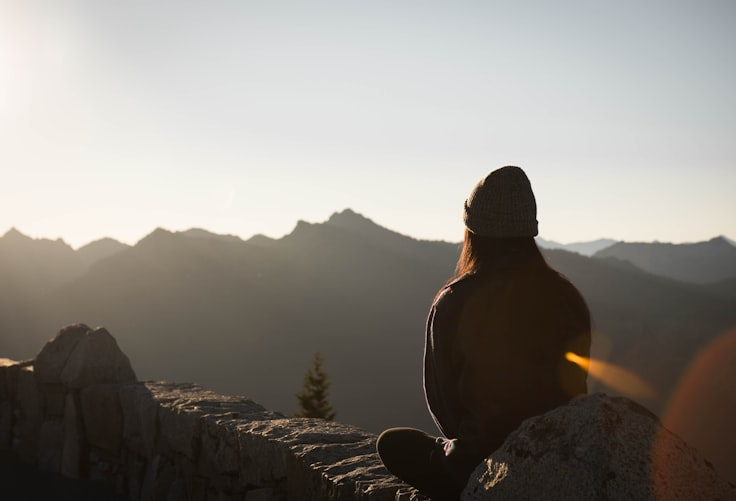

In [ ]:

from IPython.display import Image, display

display(Image(base_image_path))

In [ ]:
def preprocess_image(image_path):
    # Resimleri uygun dizilere açmak, yeniden boyutlandırmak ve biçimlendirmek için Util işlevi
    img = keras.preprocessing.image.load_img(image_path)
    img = keras.preprocessing.image.img_to_array(img)
    img = np.expand_dims(img, axis=0)
    img = inception_v3.preprocess_input(img)
    return img


def deprocess_image(x):
    # NumPy dizisini geçerli bir görüntüye dönüştürmek için Util işlevi.
    x = x.reshape((x.shape[1], x.shape[2], 3))
    # Inceptionv3 ön işlemesini geri alma
    x /= 2.0
    x += 0.5
    x *= 255.0
    # Convert to uint8 and clip to the valid range [0, 255]
    x = np.clip(x, 0, 255).astype("uint8")
    return x

In [ ]:

# Önceden eğitilmiş ImageNet ağırlıklarıyla dolu bir InceptionV3 modeli oluşturun
model = inception_v3.InceptionV3(weights="imagenet", include_top=False)

# Her "anahtar" katmanın sembolik çıktılarını alın
outputs_dict = dict(
    [
        (layer.name, layer.output)
        for layer in [model.get_layer(name) for name in layer_settings.keys()]
    ]
)

# Her hedef katman için etkinleştirme değerlerini döndüren bir model oluşturun (dict olarak)
feature_extractor = keras.Model(inputs=model.inputs, outputs=outputs_dict)

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [ ]:
def compute_loss(input_image):
    features = feature_extractor(input_image)
    # Kaybı başlat
    loss = tf.zeros(shape=())
    for name in features.keys():
        coeff = layer_settings[name]
        activation = features[name]
        # Sınırda olmayan pikselleri yalnızca kayda dahil ederek kenarlık yapaylıklarından kaçınırız.
        scaling = tf.reduce_prod(tf.cast(tf.shape(activation), "float32"))
        loss += coeff * tf.reduce_sum(tf.square(activation[:, 2:-2, 2:-2, :])) / scaling
    return loss

In [ ]:

@tf.function
def gradient_ascent_step(img, learning_rate):
    with tf.GradientTape() as tape:
        tape.watch(img)
        loss = compute_loss(img)
    # Gradyanları Hesapla.
    grads = tape.gradient(loss, img)
    # Gradyanları Normalize Et.
    grads /= tf.maximum(tf.reduce_mean(tf.abs(grads)), 1e-6)
    img += learning_rate * grads
    return loss, img


def gradient_ascent_loop(img, iterations, learning_rate, max_loss=None):
    for i in range(iterations):
        loss, img = gradient_ascent_step(img, learning_rate)
        if max_loss is not None and loss > max_loss:
            break
        print("... Loss value at step %d: %.2f" % (i, loss))
    return img

In [ ]:

original_img = preprocess_image(base_image_path)
original_shape = original_img.shape[1:3]

successive_shapes = [original_shape]
for i in range(1, num_octave):
    shape = tuple([int(dim / (octave_scale ** i)) for dim in original_shape])
    successive_shapes.append(shape)
successive_shapes = successive_shapes[::-1]
shrunk_original_img = tf.image.resize(original_img, successive_shapes[0])

img = tf.identity(original_img)
for i, shape in enumerate(successive_shapes):
    print("Processing octave %d with shape %s" % (i, shape))
    img = tf.image.resize(img, shape)
    img = gradient_ascent_loop(
        img, iterations=iterations, learning_rate=step, max_loss=max_loss
    )
    upscaled_shrunk_original_img = tf.image.resize(shrunk_original_img, shape)
    same_size_original = tf.image.resize(original_img, shape)
    lost_detail = same_size_original - upscaled_shrunk_original_img

    img += lost_detail
    shrunk_original_img = tf.image.resize(original_img, shape)

keras.preprocessing.image.save_img(result_prefix + ".png", deprocess_image(img.numpy()))

Processing octave 0 with shape (255, 375)
... Loss value at step 0: 1.00
... Loss value at step 1: 1.16
... Loss value at step 2: 1.48
... Loss value at step 3: 1.80
... Loss value at step 4: 2.11
... Loss value at step 5: 2.49
... Loss value at step 6: 2.85
... Loss value at step 7: 3.23
... Loss value at step 8: 3.47
... Loss value at step 9: 3.91
... Loss value at step 10: 4.28
... Loss value at step 11: 4.54
... Loss value at step 12: 4.89
... Loss value at step 13: 5.35
... Loss value at step 14: 5.66
... Loss value at step 15: 6.03
... Loss value at step 16: 6.39
... Loss value at step 17: 6.65
... Loss value at step 18: 6.95
... Loss value at step 19: 7.39
Processing octave 1 with shape (357, 525)
... Loss value at step 0: 1.80
... Loss value at step 1: 2.74
... Loss value at step 2: 3.69
... Loss value at step 3: 4.35
... Loss value at step 4: 4.96
... Loss value at step 5: 5.59
... Loss value at step 6: 6.14
... Loss value at step 7: 6.84
... Loss value at step 8: 7.28
... Los

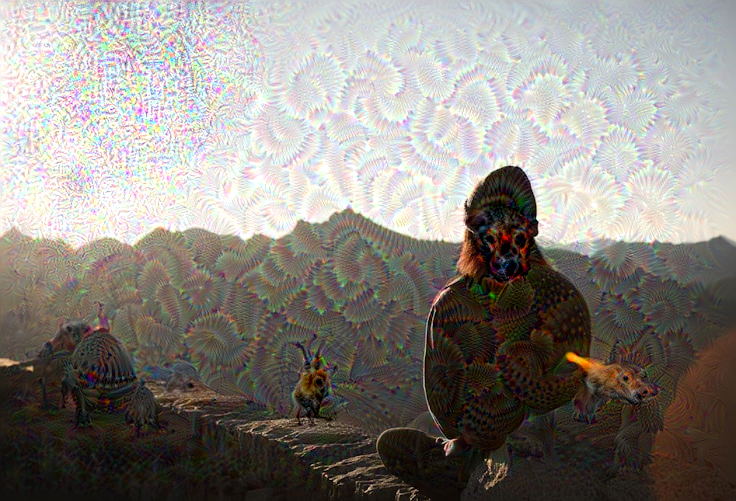

In [ ]:
display(Image(result_prefix + ".png"))

**Autoencoder ile gürültü giderme**

In [ ]:
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras.datasets import mnist
import numpy as np
from keras import backend as K
import matplotlib.pyplot as plt

In [ ]:
(x_train, _), (x_test, _) = mnist.load_data()

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


In [ ]:
x_train=x_train.astype('float32')/255
x_test=x_test.astype('float32')/25

x_train=np.reshape(x_train, (len(x_train), 28, 28, 1))#channel first
x_test=np.reshape(x_test, (len(x_test), 28, 28, 1))

In [ ]:
print("Eğitim ",x_train.shape)
print("Test ",x_test.shape)

Eğitim  (60000, 28, 28, 1)
Test  (10000, 28, 28, 1)


In [ ]:
noise_factor=0.5
x_train_noisy=x_train+noise_factor*np.random.normal(loc=0.0, scale=1.0, size=x_train.shape)
x_test_noisy=x_test+noise_factor*np.random.normal(loc=0.0, scale=1.0, size=x_test.shape)

x_train_noisy=np.clip(x_train_noisy, 0., 1.)
x_test_noisy=np.clip(x_test_noisy, 0., 1.)#gürültülü setler elde ettik

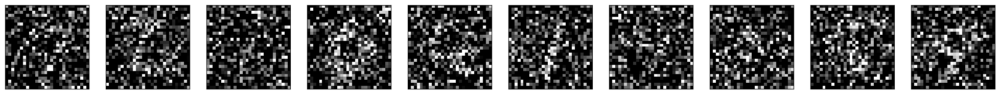

In [ ]:
#gürültülü veriyi görselleştirme
%matplotlib inline

n=10
plt.figure(figsize=(25, 4))
for i in range(n):
  ax=plt.subplot(1, n, i+1)
  plt.imshow(x_test_noisy[i].reshape(28, 28))
  plt.gray()
  ax.get_xaxis().set_visible(False)#kenarıdaki sayılar yazılmasın diye false yaptık
  ax.get_yaxis().set_visible(False)
plt.show()

In [ ]:
input_img=Input(shape=(28, 28, 1))
#encode
x=Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x=MaxPooling2D((2, 2), padding='same')(x)
x=Conv2D(32, (3, 3), activation='relu', padding='same')(x)
encoded=MaxPooling2D((2, 2), padding='same')(x)
#bottleneck

In [ ]:
#decode
x=Conv2D(32, (3, 3), activation='relu', padding='same')(encoded)
x=UpSampling2D((2, 2))(x)
x=Conv2D(32, (3, 3), activation='relu', padding='same')(x)
x=UpSampling2D((2, 2))(x)
decoded=Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)


In [ ]:
#modelin derlenmesi ve eğitimi
autoencoder=Model(input_img, decoded)
autoencoder.compile(optimizer='adadelta', loss='binary_crossentropy')


In [ ]:
from keras.callbacks import TensorBoard
autoencoder.fit(x_train_noisy, x_train, epochs=30, batch_size=128, shuffle=True, validation_data=(x_test_noisy, x_test),callbacks=[TensorBoard(log_dir='/tmp/autoencoder')])


Epoch 1/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.0105 - val_loss: 0.9431
Epoch 2/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0105 - val_loss: 0.9463
Epoch 3/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.0105 - val_loss: 0.9486
Epoch 4/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 0.0104 - val_loss: 0.9502
Epoch 5/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 0.0104 - val_loss: 0.9511
Epoch 6/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0104 - val_loss: 0.9515
Epoch 7/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 0.0103 - val_loss: 0.9515
Epoch 8/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 0.0103 - val_loss: 0.9511
Epoch 9/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 0.0103 - val_loss: 0.9504
Epoch 10/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - loss: 0.0102 - val_loss: 0.9494
Epoch 11/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - loss: 0.0102 - val_loss: 0.9483
Epoch 12/30
469/469 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step

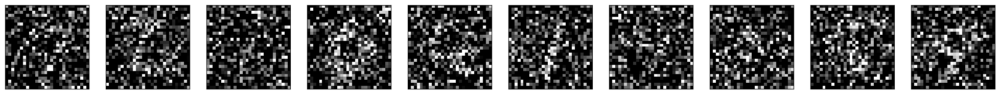

In [ ]:
#gürültülü veriyi görselleştirme
%matplotlib inline

n=10
plt.figure(figsize=(25, 4))
for i in range(n):
  ax=plt.subplot(1, n, i+1)
  plt.imshow(x_test_noisy[i].reshape(28, 28))
  plt.gray()
  ax.get_xaxis().set_visible(False)#kenarıdaki sayılar yazılmasın diye false yaptık
  ax.get_yaxis().set_visible(False)
plt.show()

## DCGAN ile Keras Kullanarak Sentetik Görüntü Oluşturulması

In [ ]:

%matplotlib inline
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
print('Tensorflow version:', tf.__version__)

Tensorflow version: 2.17.1


In [ ]:
def show(images, n_cols=None):
    n_cols = n_cols or len(images)
    n_rows = (len(images) - 1) // n_cols + 1
    if images.shape[-1] == 1:
        images = np.squeeze(images, axis=-1)
    plt.figure(figsize=(n_cols, n_rows))
    for index, image in enumerate(images):
        plt.subplot(n_rows, n_cols, index + 1)
        plt.imshow(image, cmap="binary")
        plt.axis("off")

In [ ]:
#Fashion MNIST veri kümesinin keras yoluyla indiriyoruz.
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.fashion_mnist.load_data()
x_train = x_train.astype(np.float32) / 255.0
x_test = x_test.astype(np.float32) / 255.0

29515/29515 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
26421880/26421880 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
5148/5148 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
4422102/4422102 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


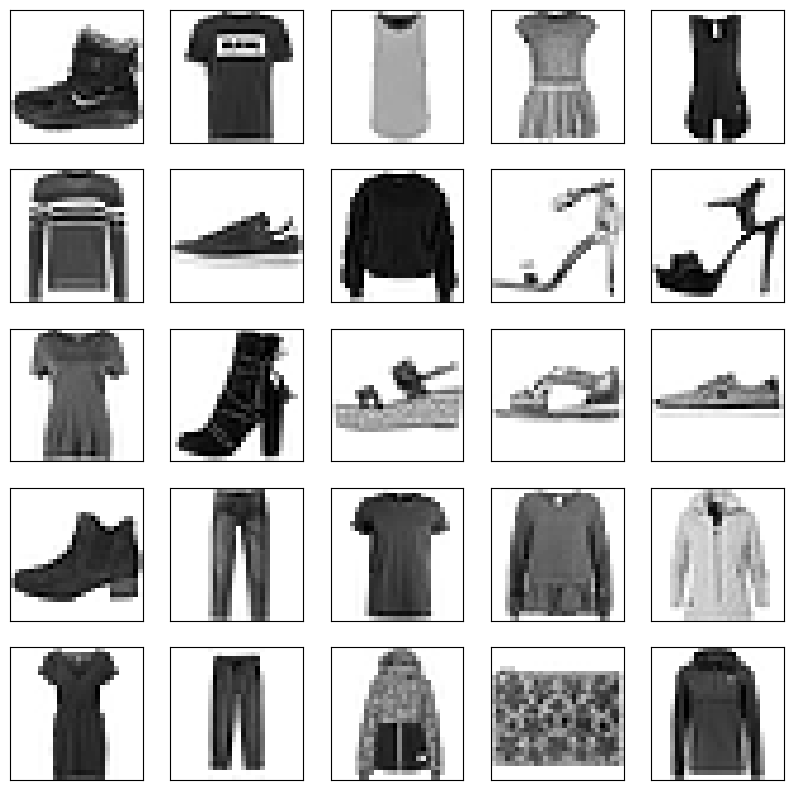

In [ ]:
# Veri kümesinden 10x10 piksel büyüklüklü 25 tane örnek ekrana yazdırıp neye benzediğine bakalım.
plt.figure(figsize=(10,10))
for i in range(25):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(x_train[i], cmap=plt.cm.binary)
plt.show()

In [ ]:
batch_size = 32
# Bu veri kümesi, bir arabelleği buffer_size elemanları ile doldurur,
#ardından seçilen elemanları yeni elemanlarla değiştirerek rastgele örnekler.
dataset = tf.data.Dataset.from_tensor_slices(x_train).shuffle(1000)
# Bu veri kümesinin ardışık öğelerini toplu olarak birleştirir.
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [ ]:
# ÜRETİCİ KATMANINDAKİ EVRİŞİMLİ SİNİR AĞI
num_features = 100 # öznitelik sayısı

# giriş değerini verdiğimiz features sayısına göre başlatıyoruz
# Conv2DTranpose versiyonunu kullanıyoruz.
generator = keras.models.Sequential([
    keras.layers.Dense(7 * 7 * 128, input_shape=[num_features]),
    keras.layers.Reshape([7, 7, 128]),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(64, (5,5), (2,2), padding="same", activation="selu"),
    keras.layers.BatchNormalization(),
    keras.layers.Conv2DTranspose(1, (5,5), (2,2), padding="same", activation="tanh"),
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


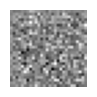

In [ ]:
noise = tf.random.normal(shape=[1, num_features])
generated_images = generator(noise, training=False)
show(generated_images, 1)

In [ ]:
discriminator = keras.models.Sequential([
    keras.layers.Conv2D(64, (5,5), (2,2), padding="same", input_shape=[28, 28, 1]),
    keras.layers.LeakyReLU(0.2),
    keras.layers.Dropout(0.3),
    keras.layers.Conv2D(128, (5,5), (2,2), padding="same"),
    keras.layers.LeakyReLU(0.2),
    keras.layers.Dropout(0.3),
    keras.layers.Flatten(),
    keras.layers.Dense(1, activation='sigmoid')
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [ ]:
# Üretilen görsel için ayırt edici %50nin altında bir değer üretti ilk adım için
decision = discriminator(generated_images)
print(decision)

tf.Tensor([[0.49969596]], shape=(1, 1), dtype=float32)


In [ ]:

discriminator.compile(loss="binary_crossentropy", optimizer="rmsprop")
discriminator.trainable = False
gan = keras.models.Sequential([generator, discriminator])
gan.compile(loss="binary_crossentropy", optimizer="rmsprop")

In [ ]:
from IPython import display
from tqdm import tqdm
seed = tf.random.normal(shape=[batch_size, 100])

In [ ]:
from tqdm import tqdm
def train_dcgan(gan, dataset, batch_size, num_features, epochs=5):
    generator, discriminator = gan.layers
    for epoch in tqdm(range(epochs)):
        print("Epoch {}/{}".format(epoch + 1, epochs))
        for X_batch in dataset:
            noise = tf.random.normal(shape=[batch_size, num_features])
            generated_images = generator(noise)
            X_fake_and_real = tf.concat([generated_images, X_batch], axis=0)
            y1 = tf.constant([[0.]] * batch_size + [[1.]] * batch_size)
            discriminator.trainable = True
            discriminator.train_on_batch(X_fake_and_real, y1)
            noise = tf.random.normal(shape=[batch_size, num_features])
            y2 = tf.constant([[1.]] * batch_size)
            discriminator.trainable = False
            gan.train_on_batch(noise, y2)
            # Üretilen görüntüleri ekrana yazdırıp doyaya kaydedelim
        display.clear_output(wait=True)
        generate_and_save_images(generator, epoch + 1, seed)

    display.clear_output(wait=True)
    generate_and_save_images(generator, epochs, seed)

In [ ]:
## Kaynak: https://www.tensorflow.org/tutorials/generative/dcgan#create_a_gif
def generate_and_save_images(model, epoch, test_input):
  # 'Eğitim' False seçeneğine ayarlandı.
  # Böylece tüm katmanlar çıkarım modunda (batchnorm) çalışır.
  predictions = model(test_input, training=False)

  fig = plt.figure(figsize=(10,10))

  for i in range(25):
      plt.subplot(5, 5, i+1)
      plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='binary')
      plt.axis('off')

  plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
  plt.show()

In [ ]:
# Eğitim için yeniden boyutlandırmanın yapılması
x_train_dcgan = x_train.reshape(-1, 28, 28, 1) * 2. - 1.

In [ ]:
#Batch size boyutunun ve shuffle özelliklerinin belirlenmesi
batch_size = 32
dataset = tf.data.Dataset.from_tensor_slices(x_train_dcgan)
dataset = dataset.shuffle(1000)
dataset = dataset.batch(batch_size, drop_remainder=True).prefetch(1)

In [ ]:
# Eğitim gan modeli, tanımlanan dataset için belirlenen batch_size boyutu ve öznitelik sayısı ile
# 10 epoch olarak gerçekleşecek, siz de epoch sayısını değiştirerek modelin gelişimini gözlemlereyebilrisiniz.
%%time
train_dcgan(gan, dataset, batch_size, num_features, epochs=10)

In [ ]:

noise = tf.random.normal(shape=[batch_size, num_features])
generated_images = generator(noise)
show(generated_images, 8)

In [ ]:
# Sonuçları GIF olarak göstermek için bu kısmı çalıştırın.
## Kaynak: https://www.tensorflow.org/tutorials/generative/dcgan#create_a_gif
import imageio
import glob

anim_file = 'dcgan.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
  filenames = glob.glob('image*.png')
  filenames = sorted(filenames)
  last = -1
  for i,filename in enumerate(filenames):
    frame = 2*(i)
    if round(frame) > round(last):
      last = frame
    else:
      continue
    image = imageio.imread(filename)
    writer.append_data(image)
  image = imageio.imread(filename)
  writer.append_data(image)

from IPython.display import Image
Image(open(anim_file,'rb').read())

# KERAS FUNCTIONAL API

In [ ]:
from keras import Input, layers
input_tensor=Input(shape=(32,))
dense=layers.Dense(32, activation='relu')
output_tensor=dense(input_tensor)

In [ ]:
from keras.models import Sequential, Model

In [ ]:
#sequential model
seq_model=Sequential()
seq_model.add(layers.Dense(32, activation='relu', input_shape=(64,)))
seq_model.add(layers.Dense(32, activation ='relu'))
seq_model.add(layers.Dense(10, activation ='sigmoid'))

seq_model.summary()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 10)                  │             330 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,466 (13.54 KB)

 Trainable params: 3,466 (13.54 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#functionl model
input_tensor = Input(shape = (64,))

x = layers.Dense(32, activation='relu')(input_tensor)

x =layers.Dense(32, activation='relu')(x)

output_tensor = layers.Dense(10, activation='softmax')(x)

model = Model(input_tensor, output_tensor)

model.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)           │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 32)                  │           2,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 32)                  │           1,056 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 10)                  │             330 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,466 (13.54 KB)

 Trainable params: 3,466 (13.54 KB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
#modelin derlenmesi
model.compile(optimizer='rmsprop', loss = 'categorical_crossentropy')

In [ ]:
import numpy as np
#rastgele veri üretiyoruz
x_train = np.random.random((1000, 64))
y_train = np.random.random((1000, 10))

In [ ]:
model.fit(x_train, y_train, epochs=10, batch_size=128)
score =model.evaluate(x_train, y_train)

Epoch 1/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - loss: 11.6571
Epoch 2/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 12.3073  
Epoch 3/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 13.5899 
Epoch 4/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 15.2681 
Epoch 5/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 17.5569 
Epoch 6/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 20.9678 
Epoch 7/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 24.7955 
Epoch 8/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 28.6547 
Epoch 9/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 33.6474 
Epoch 10/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 38.7070 
32/32 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 42.6709


### Dallanan Model

In [ ]:
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input, Dense, Flatten, Conv2D, MaxPooling2D, concatenate # Import Conv2D and concatenate directly

In [ ]:
visible = Input(shape=(64, 64, 1))

In [ ]:
#1. evrişim katmanı
conv1 = Conv2D(32, kernel_size = 4, activation = 'relu')(visible)
pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)
flat1 = Flatten()(pool1)

#2. evrişim katmanı
conv2 = Conv2D(16, kernel_size = 8, activation = 'relu')(visible)
pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
flat2 = Flatten()(pool2)

#birleştirme katmanı

merge = concatenate([flat1, flat2])

hidden1 = Dense(10, activation='relu')(merge)

#çıkış katmanı

output = Dense(1, activation='sigmoid')(hidden1)
model = Model(inputs = visible, outputs = output)

# modeli özetle

model.summary()

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_7             │ (None, 64, 64, 1)      │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 61, 61, 32)     │            544 │ input_layer_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)         │ (None, 57, 57, 16)     │          1,040 │ input_layer_7[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 30, 30, 32)     │              0 │ conv2d_7[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, 28, 28, 16)     │              0 │ conv2d_8[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_1 (Flatten)       │ (None, 28800)          │              0 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ flatten_2 (Flatten)       │ (None, 12544)          │              0 │ max_pooling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 41344)          │              0 │ flatten_1[0][0],       │
│                           │                        │                │ flatten_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_9 (Dense)           │ (None, 10)             │        413,450 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_10 (Dense)          │ (None, 1)              │             11 │ dense_9[0][0]          │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 415,045 (1.58 MB)

 Trainable params: 415,045 (1.58 MB)

 Non-trainable params: 0 (0.00 B)

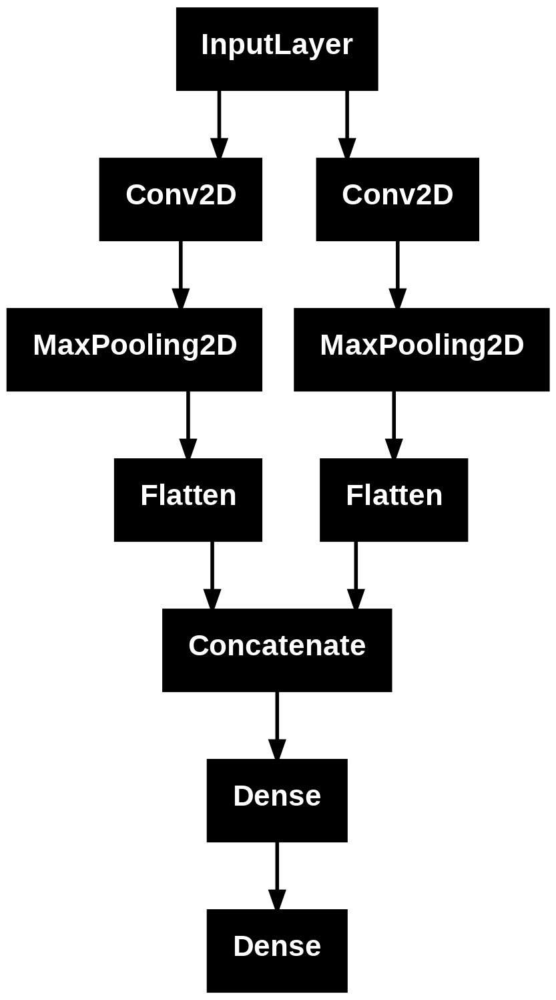

In [ ]:

plot_model(model, to_file='model.png')

In [ ]:
# TensorBoard notebook eklentilerini yüklemek
%load_ext tensorboard

In [ ]:
import tensorflow as tf
import datetime, os

In [ ]:
fashion_mnist = tf.keras.datasets.fashion_mnist

(x_train, y_train),(x_test, y_test) = fashion_mnist.load_data()
x_train, x_test = x_train / 255.0, x_test / 255.0

In [ ]:
def create_model():
  return tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(28, 28)),
    tf.keras.layers.Dense(512, activation='relu'),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Dense(10, activation='softmax')
  ])

In [ ]:
def train_model():

  model = create_model()
  model.compile(optimizer='adam',
                loss='sparse_categorical_crossentropy',
                metrics=['accuracy'])

  logdir = os.path.join("logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  tensorboard_callback = tf.keras.callbacks.TensorBoard(logdir, histogram_freq=1)

  model.fit(x=x_train,
            y=y_train,
            epochs=5,
            validation_data=(x_test, y_test),
            callbacks=[tensorboard_callback])

train_model()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.7831 - loss: 0.6044 - val_accuracy: 0.8335 - val_loss: 0.4556
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8542 - loss: 0.3975 - val_accuracy: 0.8522 - val_loss: 0.3994
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.8685 - loss: 0.3531 - val_accuracy: 0.8630 - val_loss: 0.3856
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 8s 4ms/step - accuracy: 0.8777 - loss: 0.3316 - val_accuracy: 0.8653 - val_loss: 0.3614
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.8856 - loss: 0.3111 - val_accuracy: 0.8725 - val_loss: 0.3544


In [ ]:
%tensorboard --logdir logs

<IPython.core.display.Javascript object>

In [ ]:
train_model()

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 9s 4ms/step - accuracy: 0.7843 - loss: 0.6110 - val_accuracy: 0.8476 - val_loss: 0.4092
Epoch 2/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.8557 - loss: 0.3930 - val_accuracy: 0.8576 - val_loss: 0.3877
Epoch 3/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8707 - loss: 0.3508 - val_accuracy: 0.8614 - val_loss: 0.3778
Epoch 4/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.8807 - loss: 0.3240 - val_accuracy: 0.8642 - val_loss: 0.3673
Epoch 5/5
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 10s 3ms/step - accuracy: 0.8853 - loss: 0.3089 - val_accuracy: 0.8764 - val_loss: 0.3447
